In [1]:
from glob import glob
from pathlib import Path
import sys
sys.path.append("../")

from jax import numpy as jnp
from jax import Array
import h5py

In [2]:
paths = {"Lorenz Attractor": "../results/lorenz/dt__*.h5", "Van der Pol Oscillator": "../results/vanderpol/dt__*.h5"}

results = {k: {float(Path(file).name.removeprefix("dt__").removesuffix(".h5").replace("_", ".")): h5py.File(file) for file in glob(path)} for k, path in paths.items()}

In [3]:
from matplotlib import pyplot as plt
from matplotlib.ticker import LogFormatterExponent
from matplotlib.lines import Line2D
from tueplots import bundles
from tueplots.constants.color import rgb

plt.rcParams.update(bundles.beamer_moml())
colors_eps = [rgb.tue_red, rgb.tue_blue, rgb.tue_green]
color_true = rgb.tue_dark

In [4]:
def closest_t_indices(reference: Array, test: Array) -> Array:
    # https://stackoverflow.com/a/20785149
    
    idx1 = jnp.searchsorted(reference, test)
    idx2 = jnp.clip(idx1 - 1, 0, len(reference) - 1)

    diff1 = reference[idx1] - test
    diff2 = test - reference[idx2]

    return jnp.where(diff1 <= diff2, idx1, idx2)

# Van-der-Pol Oscillator

In [5]:
ode_name = "Van der Pol Oscillator"
C = 2
r = results[ode_name]
min_dt = min(r.keys())
dts_sorted = sorted(r.keys())

def fn_label(idx):
    if idx > 1:
        return f"$d^{idx+1}x(t)/dt^{idx+1}$"
    elif idx == 1:
        return f"$dx(t)/dt$"
    else:
        return f"$x(t)$"

## Trajectories

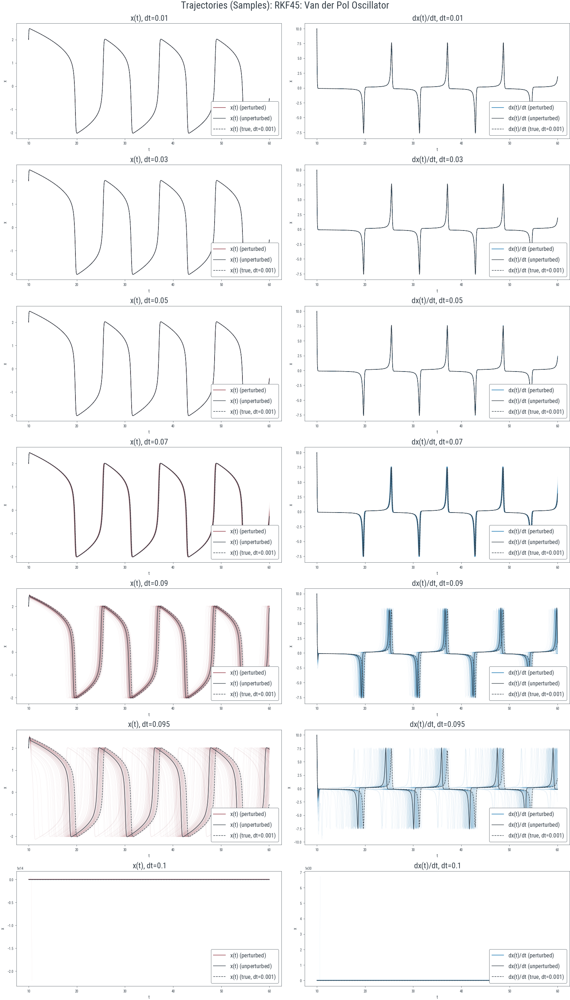

In [6]:
fig, axs = plt.subplots(len(r) - 1, C, figsize=(C*8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"])
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts)
        xs_true_cap = xs_true[t_indices]
            
        for idx in range(xs_eps_p.shape[1]):
            ax.plot(ts, xs_eps_p[:, idx, col, 0], color=colors_eps[col], alpha=0.2, linewidth=0.2)
        ax.plot(ts, xs[:, col, 0], color=color_true)
        ax.plot(ts, xs_true_cap[:, col, 0], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (unperturbed)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Samples): RKF45: {ode_name}", fontsize=20);

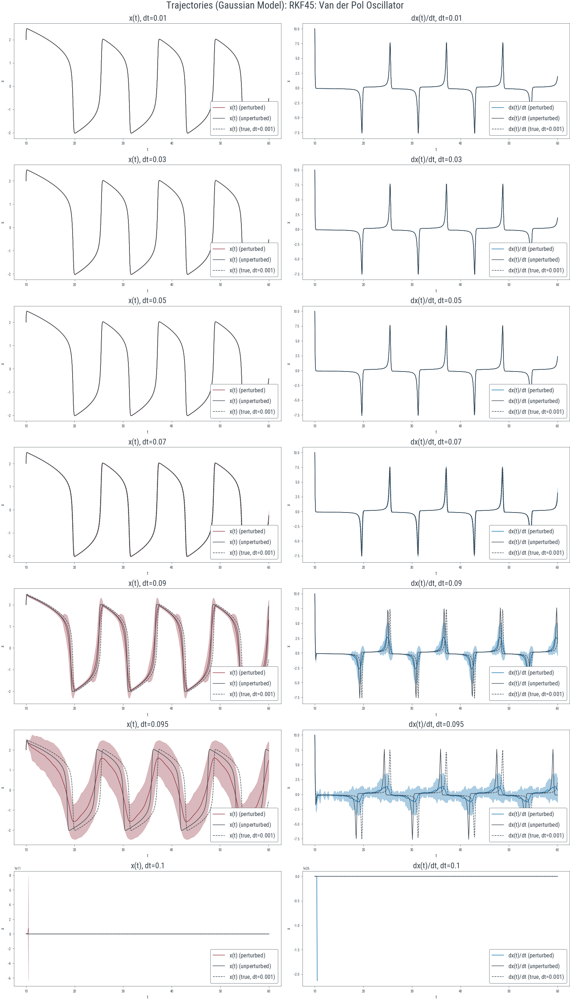

In [7]:
fig, axs = plt.subplots(len(r) - 1, C, figsize=(C*8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"])
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts)
        xs_true_cap = xs_true[t_indices]
            
        mean = jnp.mean(xs_eps_p[:, :, col, 0], axis=1)
        std = jnp.std(xs_eps_p[:, :, col, 0], ddof=1, axis=1)
        ax.plot(ts, mean, color=colors_eps[col])
        ax.fill_between(ts, mean - std, mean + std, color=colors_eps[col], alpha=0.33)
        ax.plot(ts, xs[:, col, 0], color=color_true)
        ax.plot(ts, xs_true_cap[:, col, 0], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (unperturbed)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Gaussian Model): RKF45: {ode_name}", fontsize=20);

## Global Error

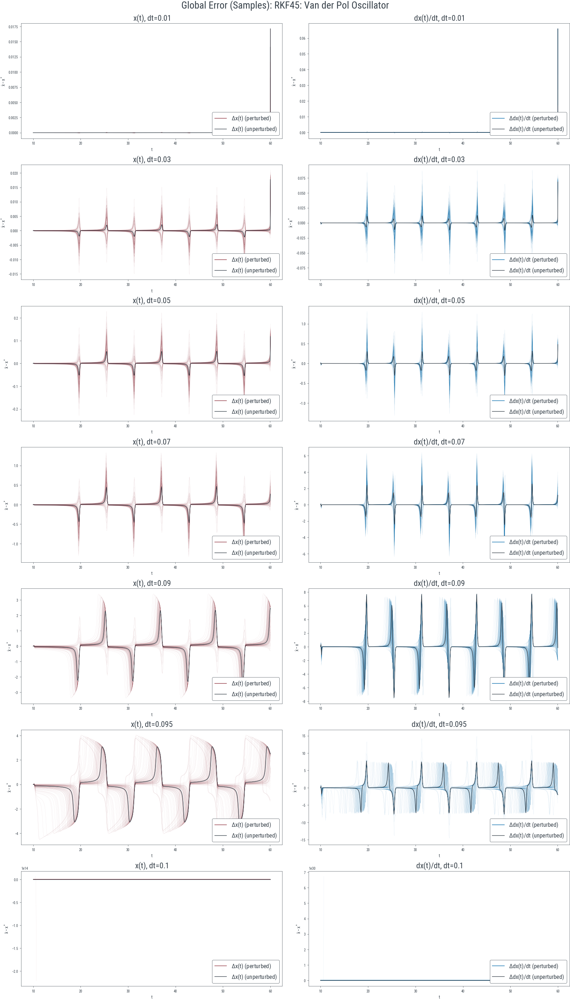

In [8]:
fig, axs = plt.subplots(len(r) - 1, C, figsize=(C*8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"])
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts)
        xs_true_cap = xs_true[t_indices]
            
        for idx in range(xs_eps_p.shape[1]):
            ax.plot(ts, xs_eps_p[:, idx, col, 0] - xs_true_cap[:, col, 0], color=colors_eps[col], alpha=0.2, linewidth=0.2)
        ax.plot(ts, xs[:, col, 0] - xs_true_cap[:, col, 0], color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$\\hat{x} - x^*$")
        
        handles = [Line2D([0], [0], label="$\\Delta$" + fn_label(col) + " (perturbed)", color=colors_eps[col]),
                    Line2D([0], [0], label="$\\Delta$" + fn_label(col) + " (unperturbed)", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Global Error (Samples): RKF45: {ode_name}", fontsize=20);

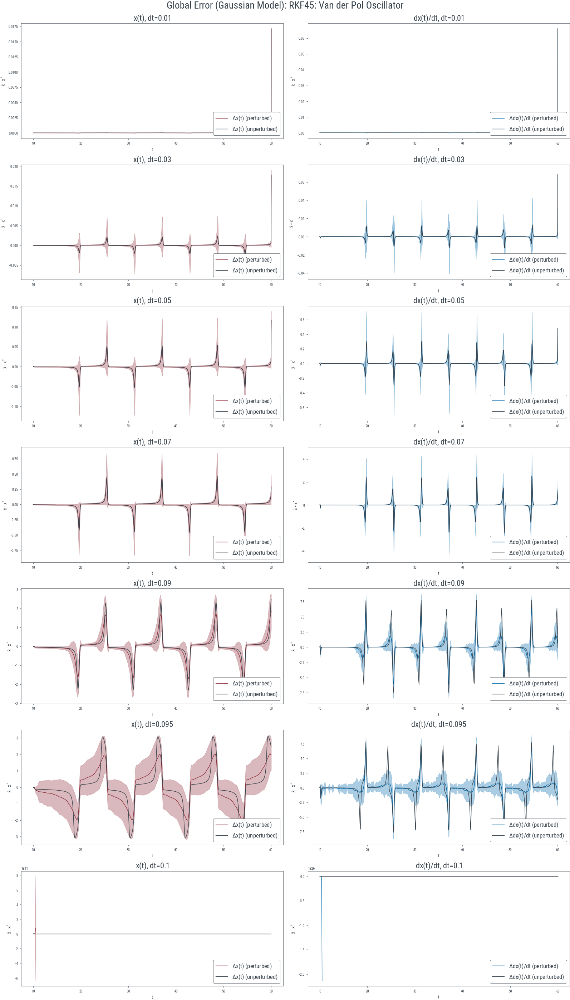

In [9]:
fig, axs = plt.subplots(len(r) - 1, C, figsize=(C*8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"])
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts)
        xs_true_cap = xs_true[t_indices]
        
        mean = jnp.mean(xs_eps_p[:, :, col, 0] - xs_true_cap[:, None, col, 0], axis=1)
        std = jnp.std(xs_eps_p[:, :, col, 0] - xs_true_cap[:, None, col, 0], ddof=1, axis=1)
        ax.plot(ts, mean, color=colors_eps[col])
        ax.fill_between(ts, mean - std, mean + std, color=colors_eps[col], alpha=0.33)
        ax.plot(ts, xs[:, col, 0] - xs_true_cap[:, col, 0], color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$\\hat{x} - x^*$")
        
        handles = [Line2D([0], [0], label="$\\Delta$" + fn_label(col) + " (perturbed)", color=colors_eps[col]),
                    Line2D([0], [0], label="$\\Delta$" + fn_label(col) + " (unperturbed)", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Global Error (Gaussian Model): RKF45: {ode_name}", fontsize=20);

## Global + Local MAE

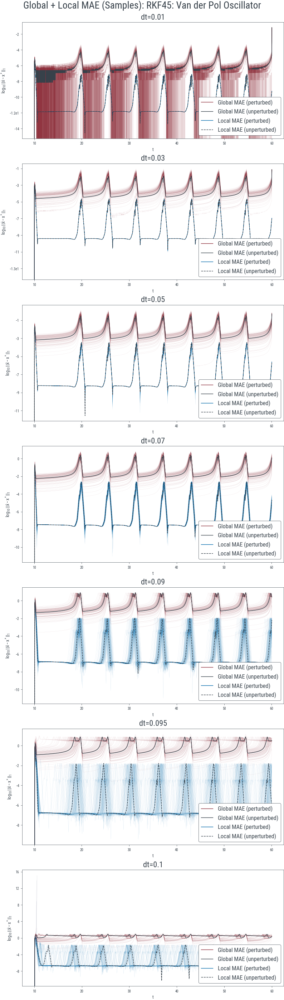

In [10]:
fig, axs = plt.subplots(len(r) - 1, 1, figsize=(8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p, epss, epss_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"]), jnp.asarray(r[dt]["epss"]), jnp.asarray(r[dt]["epss_eps_p"])
    ax = axs[row]
    t_indices = closest_t_indices(ts_true, ts)
    xs_true_cap = xs_true[t_indices]
        
    for idx in range(xs_eps_p.shape[1]):
        ax.plot(ts, jnp.linalg.norm(xs_eps_p[:, idx, :, 0] - xs_true_cap[:, :, 0], ord=2, axis=-1), color=colors_eps[0], alpha=0.2, linewidth=0.2)
        ax.plot(ts, jnp.linalg.norm(epss_eps_p[:, idx, :, 0], ord=2, axis=-1), color=colors_eps[1], alpha=0.2, linewidth=0.2)
    ax.plot(ts, jnp.linalg.norm(xs[:, :, 0] - xs_true_cap[:, :, 0], ord=2, axis=-1), color=color_true)
    ax.plot(ts, jnp.linalg.norm(epss[:, :, 0], ord=2, axis=-1), ls="--", color=color_true)
    ax.set_xlabel("$t$")
    ax.set_ylabel("$\\log_{10}||\\hat{x} - x^*||_1$")
    ax.set_yscale("log")
    ax.get_yaxis().set_major_formatter(LogFormatterExponent(base=10, labelOnlyBase=True))
    
    handles = [Line2D([0], [0], label="Global MAE (perturbed)", color=colors_eps[0]),
                Line2D([0], [0], label="Global MAE (unperturbed)", color=color_true),
                Line2D([0], [0], label="Local MAE (perturbed)", color=colors_eps[1]),
                Line2D([0], [0], ls="--", label="Local MAE (unperturbed)", color=color_true),]
    ax.set_title(f"dt={dt}", fontsize=16)
    ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Global + Local MAE (Samples): RKF45: {ode_name}", fontsize=20);

## Lorenz Attractor

In [11]:
ode_name = "Lorenz Attractor"
C = 3
r = results[ode_name]
min_dt = min(r.keys())
dts_sorted = sorted(r.keys())

def fn_label(idx):
    map_idx = {0: "x", 1: "y", 2: "z"}
    return f"{map_idx[idx]}(t)"

## Trajectories

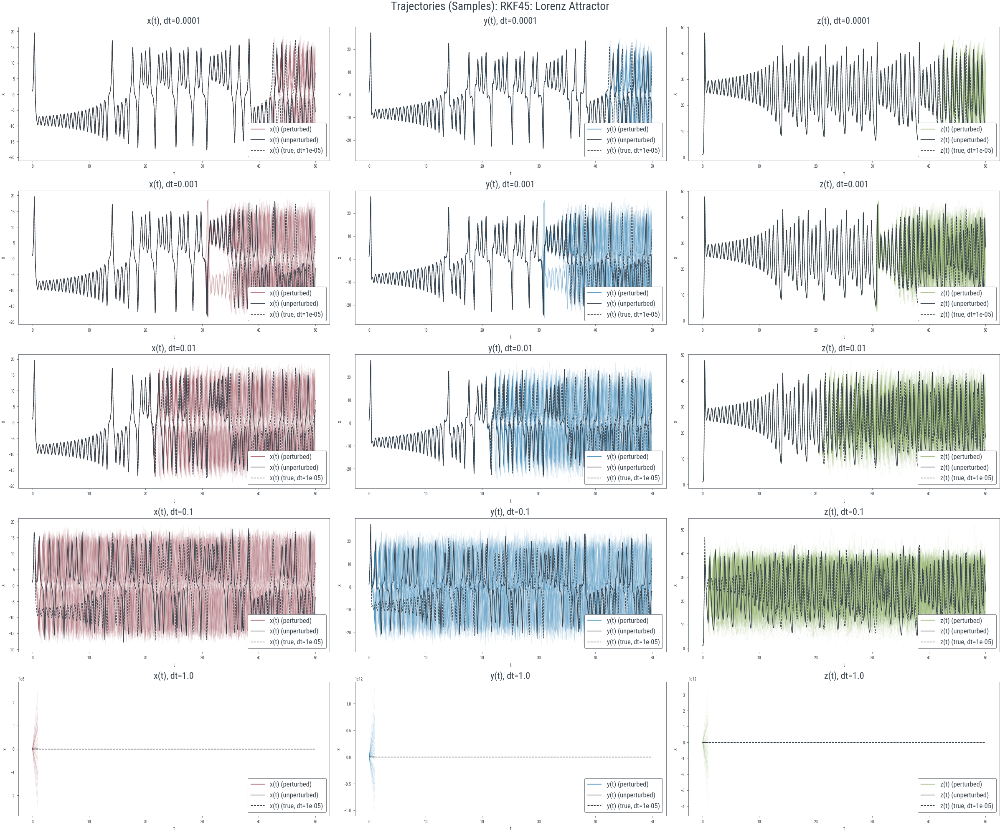

In [12]:
fig, axs = plt.subplots(len(r) - 1, C, figsize=(C*8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"])
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts)
        xs_true_cap = xs_true[t_indices]
            
        for idx in range(xs_eps_p.shape[1]):
            ax.plot(ts, xs_eps_p[:, idx, 0, col], color=colors_eps[col], alpha=0.2, linewidth=0.2)
        ax.plot(ts, xs[:, 0, col], color=color_true)
        ax.plot(ts, xs_true_cap[:, 0, col], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (unperturbed)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Samples): RKF45: {ode_name}", fontsize=20);

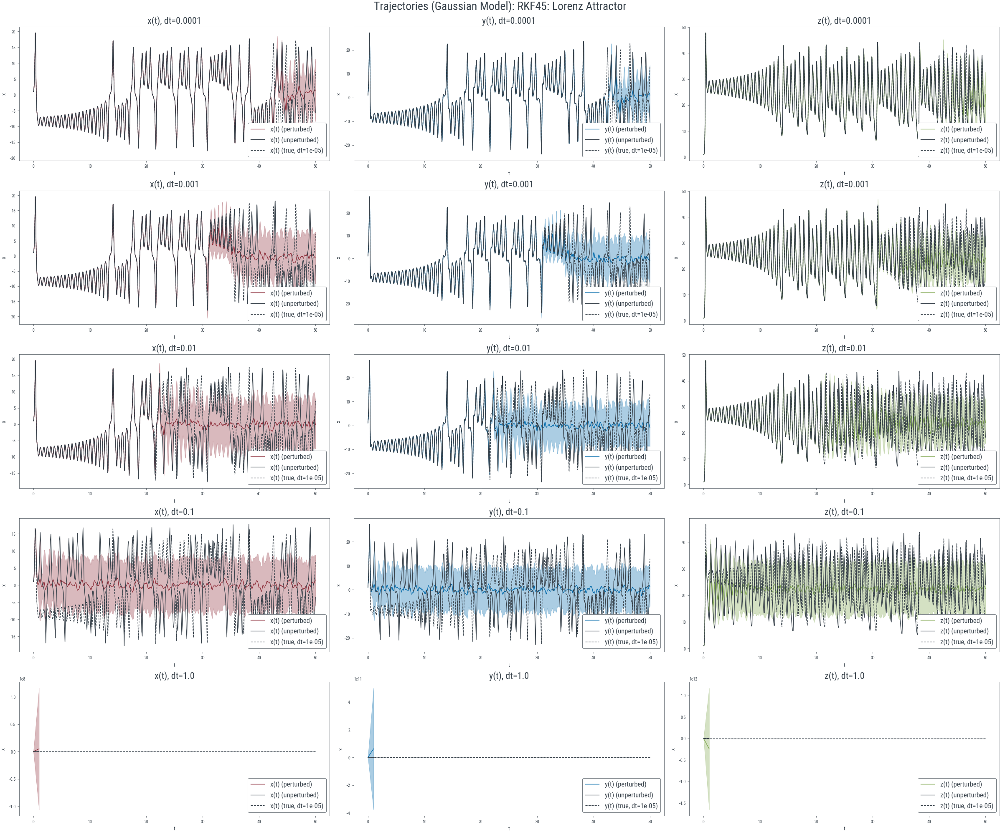

In [13]:
fig, axs = plt.subplots(len(r) - 1, C, figsize=(C*8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"])
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts)
        xs_true_cap = xs_true[t_indices]
            
        mean = jnp.mean(xs_eps_p[:, :, 0, col], axis=1)
        std = jnp.std(xs_eps_p[:, :, 0, col], ddof=1, axis=1)
        ax.plot(ts, mean, color=colors_eps[col])
        ax.fill_between(ts, mean - std, mean + std, color=colors_eps[col], alpha=0.33)
        ax.plot(ts, xs[:, 0, col], color=color_true)
        ax.plot(ts, xs_true_cap[:, 0, col], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (unperturbed)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Gaussian Model): RKF45: {ode_name}", fontsize=20);

## Global Error

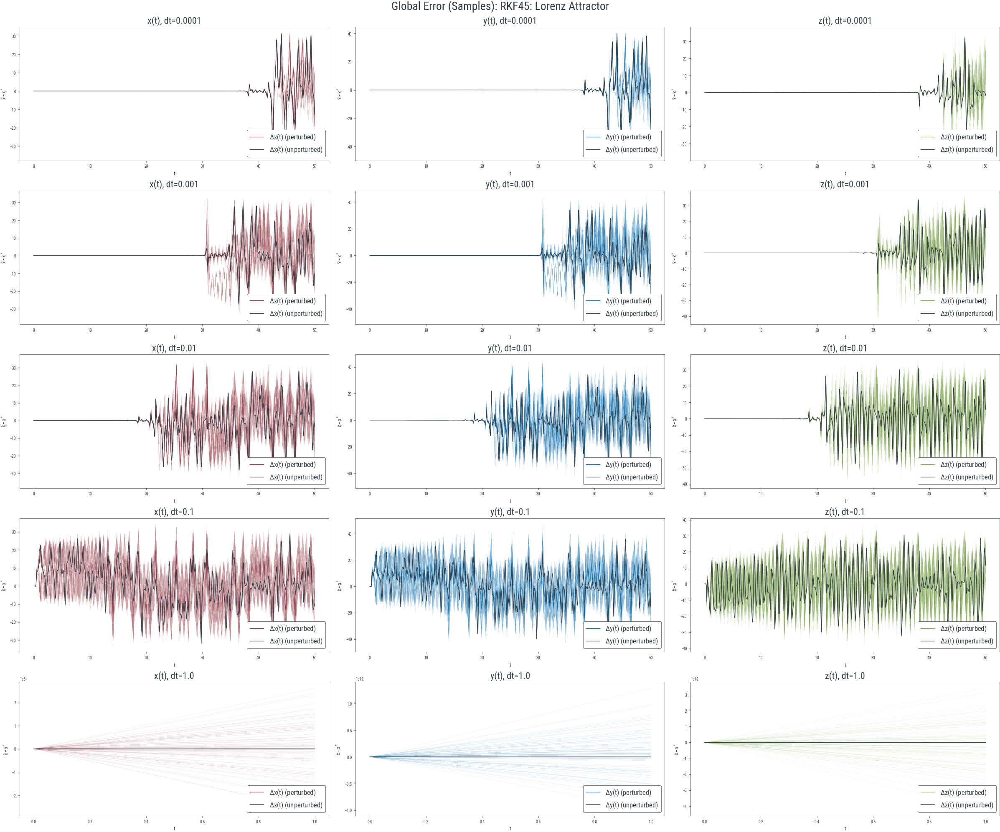

In [14]:
fig, axs = plt.subplots(len(r) - 1, C, figsize=(C*8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"])
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts)
        xs_true_cap = xs_true[t_indices]
            
        for idx in range(xs_eps_p.shape[1]):
            ax.plot(ts, xs_eps_p[:, idx, 0, col] - xs_true_cap[:, 0, col], color=colors_eps[col], alpha=0.2, linewidth=0.2)
        ax.plot(ts, xs[:, 0, col] - xs_true_cap[:, 0, col], color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$\\hat{x} - x^*$")
        
        handles = [Line2D([0], [0], label="$\\Delta$" + fn_label(col) + " (perturbed)", color=colors_eps[col]),
                    Line2D([0], [0], label="$\\Delta$" + fn_label(col) + " (unperturbed)", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Global Error (Samples): RKF45: {ode_name}", fontsize=20);

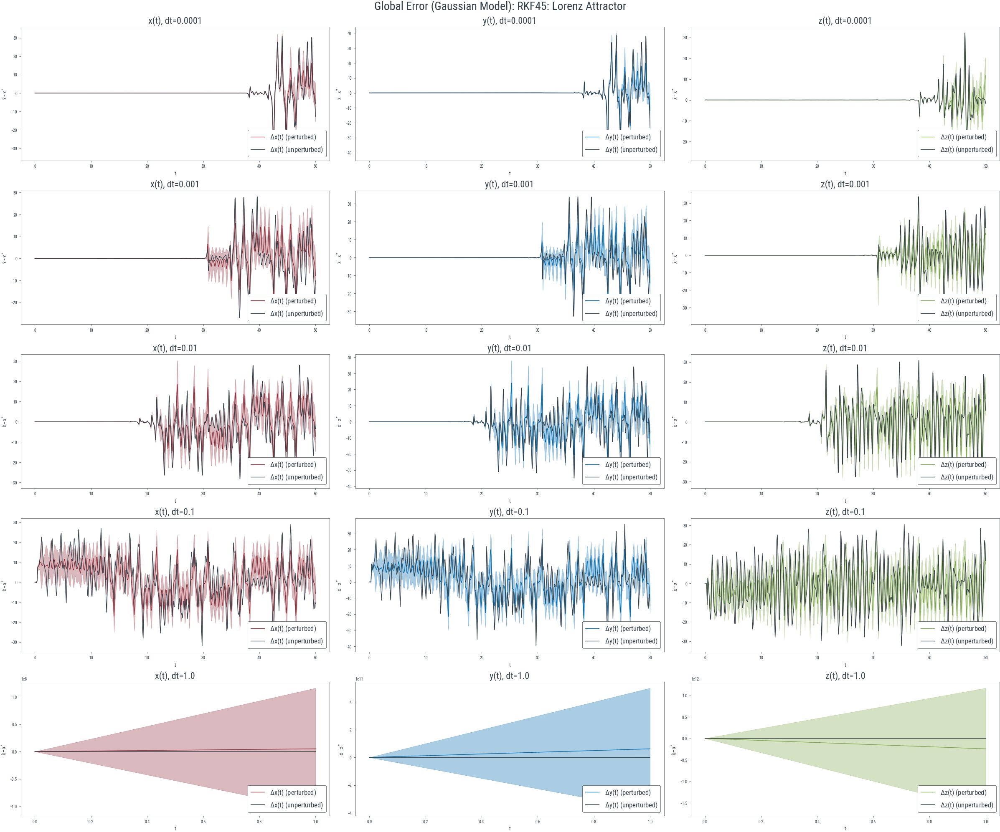

In [15]:
fig, axs = plt.subplots(len(r) - 1, C, figsize=(C*8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"])
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts)
        xs_true_cap = xs_true[t_indices]
        
        mean = jnp.mean(xs_eps_p[:, :, 0, col] - xs_true_cap[:, None, 0, col], axis=1)
        std = jnp.std(xs_eps_p[:, :, 0, col] - xs_true_cap[:, None, 0, col], ddof=1, axis=1)
        ax.plot(ts, mean, color=colors_eps[col])
        ax.fill_between(ts, mean - std, mean + std, color=colors_eps[col], alpha=0.33)
        ax.plot(ts, xs[:, 0, col] - xs_true_cap[:, 0, col], color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$\\hat{x} - x^*$")
        
        handles = [Line2D([0], [0], label="$\\Delta$" + fn_label(col) + " (perturbed)", color=colors_eps[col]),
                    Line2D([0], [0], label="$\\Delta$" + fn_label(col) + " (unperturbed)", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Global Error (Gaussian Model): RKF45: {ode_name}", fontsize=20);

## Global + Local MAE

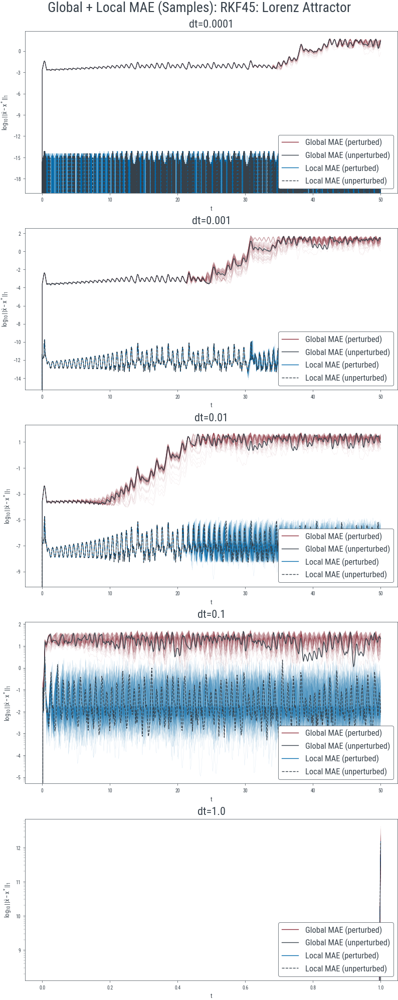

In [16]:
fig, axs = plt.subplots(len(r) - 1, 1, figsize=(8, (len(r) - 1)*4))
ts_true, xs_true = jnp.asarray(r[min_dt]["ts"]), jnp.asarray(r[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts, xs, xs_eps_p, epss, epss_eps_p = jnp.asarray(r[dt]["ts"]), jnp.asarray(r[dt]["xs"]), jnp.asarray(r[dt]["xs_eps_p"]), jnp.asarray(r[dt]["epss"]), jnp.asarray(r[dt]["epss_eps_p"])
    ax = axs[row]
    t_indices = closest_t_indices(ts_true, ts)
    xs_true_cap = xs_true[t_indices]
        
    for idx in range(xs_eps_p.shape[1]):
        ax.plot(ts, jnp.linalg.norm(xs_eps_p[:, idx, 0, :] - xs_true_cap[:, 0, :], ord=2, axis=-1), color=colors_eps[0], alpha=0.2, linewidth=0.2)
        ax.plot(ts, jnp.linalg.norm(epss_eps_p[:, idx, 0, :], ord=2, axis=-1), color=colors_eps[1], alpha=0.2, linewidth=0.2)
    ax.plot(ts, jnp.linalg.norm(xs[:, 0, :] - xs_true_cap[:, 0, :], ord=2, axis=-1), color=color_true)
    ax.plot(ts, jnp.linalg.norm(epss[:, 0, :], ord=2, axis=-1), ls="--", color=color_true)
    ax.set_xlabel("$t$")
    ax.set_ylabel("$\\log_{10}||\\hat{x} - x^*||_1$")
    ax.set_yscale("log")
    ax.get_yaxis().set_major_formatter(LogFormatterExponent(base=10, labelOnlyBase=True))
    
    handles = [Line2D([0], [0], label="Global MAE (perturbed)", color=colors_eps[0]),
                Line2D([0], [0], label="Global MAE (unperturbed)", color=color_true),
                Line2D([0], [0], label="Local MAE (perturbed)", color=colors_eps[1]),
                Line2D([0], [0], ls="--", label="Local MAE (unperturbed)", color=color_true),]
    ax.set_title(f"dt={dt}", fontsize=16)
    ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Global + Local MAE (Samples): RKF45: {ode_name}", fontsize=20);